In [ ]:
#importing tools
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import os

#turning images into tensors (= numerical representations)
labelscsv= pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog-vision/Dog labels.csv")
print(labelscsv.describe())
print(labelscsv.head())



                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


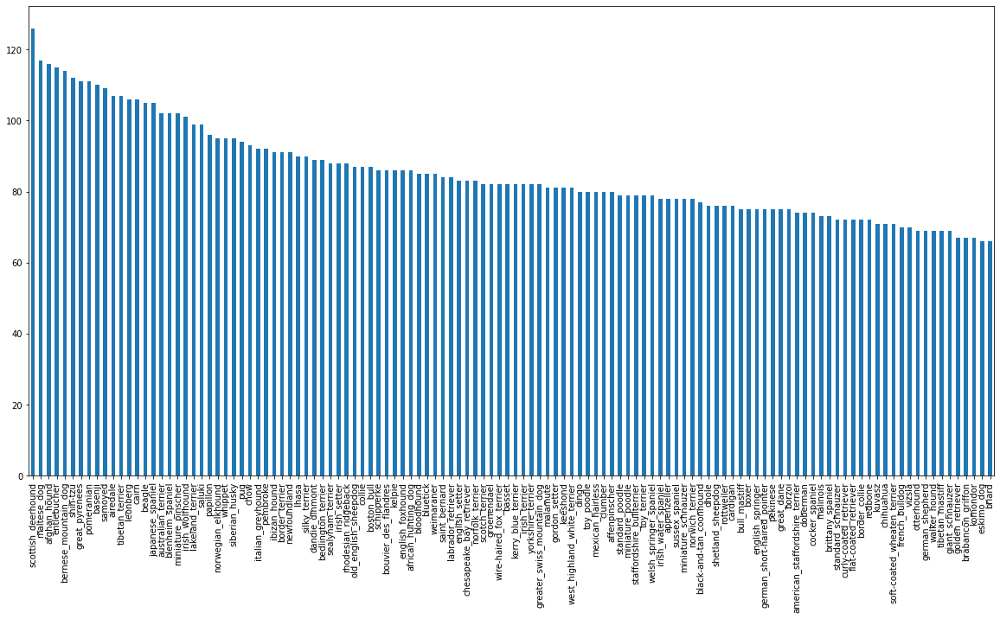

In [ ]:
labelscsv["breed"].value_counts().plot.bar(figsize=(20,10));

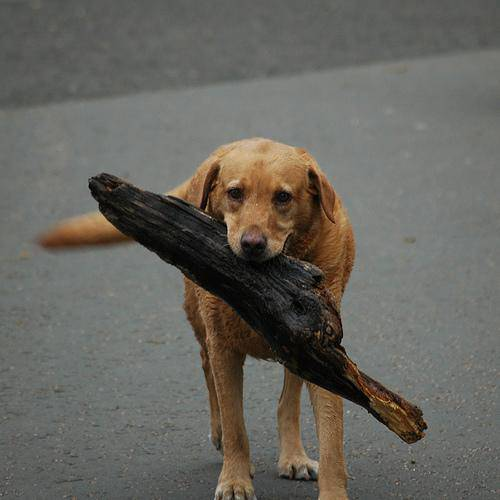

In [ ]:
from IPython.display import Image
Image ("/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")


In [ ]:
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/"+ fname +".jpg" for fname in labelscsv["id"]]
filenames [:10]


['/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/"))==len (filenames):
  print ("filename number matches!")
else:
  print("filename number does not match. Please check target directory.")

filename number matches!


In [ ]:
os.listdir("/content/drive/MyDrive/Colab Notebooks/Dog-vision/train/")[:10]

['e7c5692d044250d303a839d989132bf1.jpg',
 'e8013a8357f9eec2369ee4e3fab710a1.jpg',
 'e7f3274adaad369068602a422e9df192.jpg',
 'e8057e2f1e3bca4e9f4a2af48a9a9c46.jpg',
 'e7ab74acdc860dfb93271901da085ffd.jpg',
 'e7a8a3681524405b2e987ffbaff6d173.jpg',
 'e7af30693df78697b8541fb5e2e46941.jpg',
 'e7faa5748d8320f604aeb3fd5bbe4ab0.jpg',
 'e79f822b26adace4455db1fcd94ab47e.jpg',
 'e7f491cb903ff0a294eb63c625ef090e.jpg']

In [ ]:
labels = np.array(labelscsv["breed"])
if len(labels) == len(filenames):
  print ("number of labels matches number of filenames")
else: 
  print ("numbers do not match. please check.")
labels

number of labels matches number of filenames


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:5]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0]) #original label
print (np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean
print(boolean_labels[0].astype(int)) #now in numbers

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#split training data into a validation set
#setup x&y variables
X= filenames
y= boolean_labels

In [ ]:
#We'll experiment with 1000 images first before running full training
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:11000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
#To preprocess images into tensors:
#https://www.tesnorflow.org/tutorials/load_data/images
#convert image into numpy arrays
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
#define image size fro standardization
IMG_SIZE = 224
#create a function to preprocess images
def process_image(image_path, img_size=IMG_SIZE):
  #read in an image file
  image = tf.io.read_file(image_path)
  #turn the jpeg into numerical tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  #normalization = convert the colour channel values from 0-255 to 0-1 decimal (float) values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #resize
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image
  


In [ ]:
#to use tensorfow efficiently we need to turn our data into batches
#function to help tensorflow with tuples in the form of (image, label)
#takes an image filename and the associated label, processes the image and returns the tuple
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label


In [ ]:
#demo of the functions above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE =32
#create a function to turn data of images(X) and labels(y) into batches
#it will shuffle it if it is training data only
#it will accept test data (with no labels(y))
def create_data_batches(X, y=None, batch_size= BATCH_SIZE, valid_data= False, test_data=False):
  if test_data:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
     print("creating validation data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
     data_batch = data.map(get_image_label).batch(BATCH_SIZE)
     return data_batch
  else:
     print("creating training data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    #shuffling pathnames and labels before mapping is faster
     data = data.shuffle(buffer_size= len(X))
     #create (preprocessed image, label) tuples
     data = data.map(get_image_label)
     #turn the training data into batches
     data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
#create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
creating validation data batches...


In [ ]:
#checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
#Visualizing data batches
import matplotlib.pyplot as plt
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    




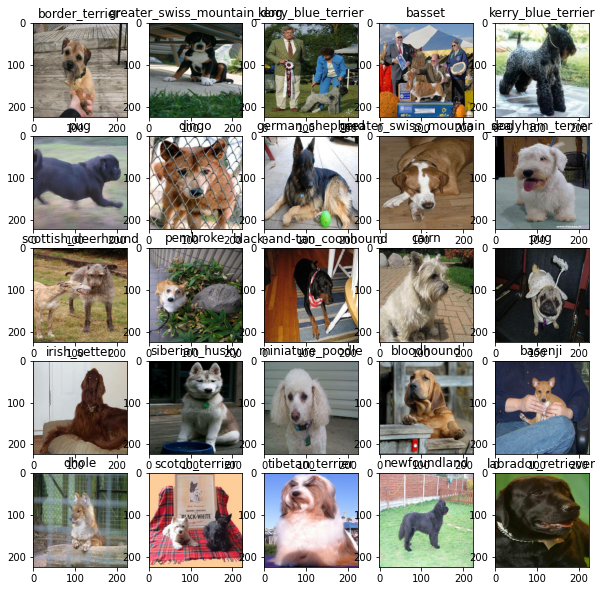

In [ ]:
#now visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

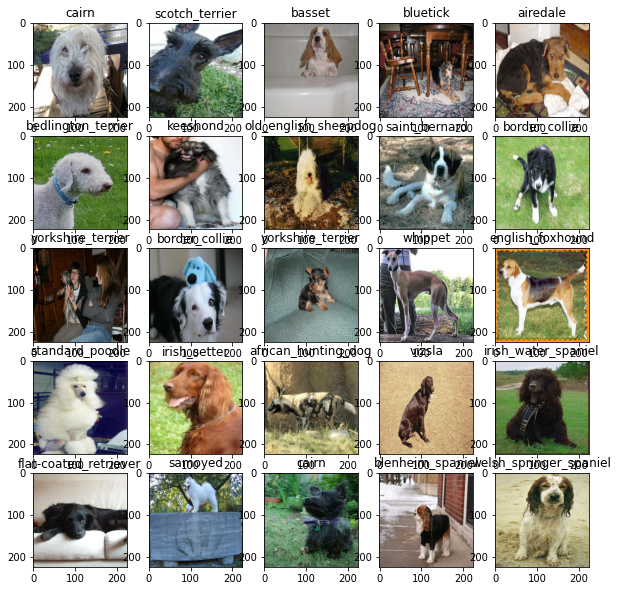

In [ ]:
#now visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
##Building a model
#input shape (images as tensors)
INPUT_SHAPE =[None, IMG_SIZE,IMG_SIZE,3] 
#output shape (labels as tensors)
OUTPUT_SHAPE = len(unique_breeds)
#URL of the model we want to use
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
#now lets put it into a Keras deeplearning model
#takes the input shape, output shape and model url as parameters
#defines the layers in a sequential fashion (for a sequential model)
#compiles the model (says how it should be evaluated and improved)
#builds the model
#returns the model
#https://www.tensorflow.org/guide/keras/overview

def create_model (input_shape= INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  #setup
  print("building model with:", MODEL_URL)
  model =tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # layer 1 (input)
         tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation="softmax") # layer 2 (output)
                            ])
  #compile a multi-class classification model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
      )
  #build
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()
#the values in the summary are because it is a convolutional neural network, including from imagenet

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
##Creating callbacks
#load tensorboard extension
%load_ext tensorboard

In [ ]:
import datetime
#create a function to build a tensorboard callback
def create_tensorboard_callback():
  #create log
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-vision/logs/",
  #track every experiment
  datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
##early stopping callback = stops model frmo overfitting = Stops improving
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)



In [ ]:
#training a model
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:1}

In [ ]:
#function to train a model with callbacks
#use the fit function
#return the model

def train_model():
  #calls function to create model
  model = create_model()
  #calls function to log it in
  tensorboard = create_tensorboard_callback()
  #fit the model to the data passing it through the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
#fit the model to the data
model = train_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 197s 7s/step - loss: 4.5491 - accuracy: 0.0975 - val_loss: 3.4386 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 162ms/step - loss: 1.5956 - accuracy: 0.7025 - val_loss: 2.1937 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 4s 163ms/step - loss: 0.5504 - accuracy: 0.9425 - val_loss: 1.7146 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2468 - accuracy: 0.9812 - val_loss: 1.5350 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1443 - accuracy: 0.9962 - val_loss: 1.4673 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1009 - accuracy: 0.9987 - val_loss: 1.4123 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

In [ ]:
#checking the log
%tensorboard --logdir content/drive/MyDrive/Colab\ Notebooks/Dog-vision/logs/

<IPython.core.display.Javascript object>

In [ ]:
#Making predictions
predictions = model.predict(val_data, verbose=1)
predictions #returns the probability matrix of what the answer may be vs the "unique breeds" array (both are of len 120)
#the highest number here is what the model thinks it is the correct answer for that image
#the sum of each array's values is 1 = softmax activation

7/7 [==============================] - 4s 100ms/step


array([[8.08829383e-04, 1.42844001e-04, 2.81489891e-04, ...,
        1.69379200e-04, 4.38172137e-05, 2.37822277e-03],
       [1.87618774e-03, 1.63615667e-04, 3.62019939e-03, ...,
        1.16932628e-04, 3.78231052e-04, 6.37485573e-05],
       [6.61358572e-05, 1.92017789e-04, 7.73245210e-06, ...,
        2.42463593e-05, 1.71719894e-05, 2.38049717e-04],
       ...,
       [6.47298730e-05, 4.14950249e-04, 7.24786005e-05, ...,
        4.58714239e-05, 4.54512308e-04, 1.95199580e-04],
       [5.73590538e-03, 4.34539514e-04, 3.00068699e-04, ...,
        2.27188211e-04, 1.40654782e-04, 2.71840254e-03],
       [1.17186035e-04, 7.85978136e-06, 9.97762196e-04, ...,
        3.26021947e-03, 1.36808772e-03, 8.27456315e-05]], dtype=float32)

In [ ]:
#now interpret the predicition array
index = 7 #validation image index number
#print(predictions[index]) #(aka confidence intervals)
print(f"Max value (probability of prediction): {np.max(predictions[index])*100}%")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")



Max value (probability of prediction): 83.76073241233826%
predicted label: old_english_sheepdog


In [ ]:
#now do it at scale 
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]
pred_label = get_pred_label(predictions[9])
print(pred_label)

collie


In [ ]:
#since our validation image data is still in a batch dataset (for tensorflow to work easier)
#we need to unbatch it and then compare our predictions to our validation =truth labels
def unbatchify(data):
  images=[]
  labels=[]
#loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
#now lets put some human readable color to it all in a single plot
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color="green"
  else:
    color = "red"
  plt.title("{} {:2.0f}%  = {}".format(true_label,
                                 np.max(pred_prob)*100,
                                 pred_label), color=color
                                 )


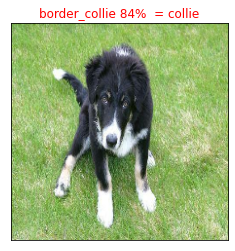

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels, images=val_images, n=9)

In [ ]:
# now lets view a graph with the top 10 predictions per image pointing out how far it is from the true label
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label=prediction_probabilities[n], labels[n]
#get the predicted label
  pred_label = get_pred_label(pred_prob)
#find the top 10 prediction confidence indexes, descending order [::-1]
  top10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #now their values
  top10_pred_values = pred_prob[top10_pred_indexes]
  #now their labels
  top10_pred_labels = unique_breeds[top10_pred_indexes]
  #setup plot
  top_plot = plt.bar(np.arange(len(top10_pred_labels)),
                     top10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top10_pred_labels)), 
             labels=top10_pred_labels,
             rotation="vertical")
  #paint the true label in green
  if np.isin(true_label, top10_pred_labels):
    top_plot[np.argmax(top10_pred_labels==true_label)].set_color("green")
  else:
    pass

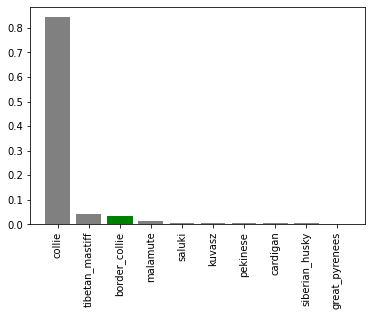

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

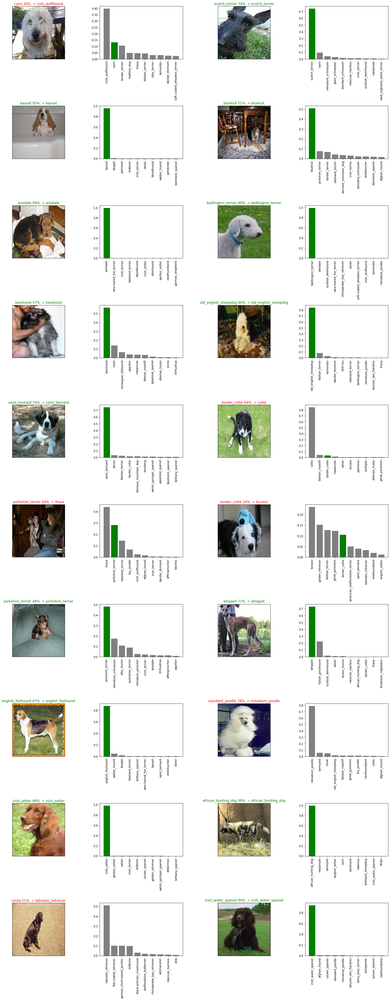

In [ ]:
#def plot_images():
i_mult = 0
num_rows = 10
num_cols =2
num_img = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_img):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_mult)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_mult)
plt.tight_layout(h_pad=1.0)
plt.show()


In [ ]:
#create a function to save our datestamped trained models
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%M%H%S"))
  model_path=modeldir +"-"+suffix+".h5" #save it in model format
  print(f"saving model to: {model_path}...")
  model.save(model_path)
  return model_path
#create a function to load a saved trained model
def load_model(model_path):

  print(f"loading model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
#save our model
save_model(model, suffix="1000-images-mobilenetv2-Adam")

saving model to: /content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221204-170300-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221204-170300-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#load a saved model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221203-271852-1000-images-mobilenetv2-Adam.h5')

loading model from: /content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221203-271852-1000-images-mobilenetv2-Adam.h5...


In [ ]:
#evaluate the saved model vs current model
model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 1.2848 - accuracy: 0.6600


[1.2848021984100342, 0.6600000262260437]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 99ms/step - loss: 1.2443 - accuracy: 0.6650


[1.2442843914031982, 0.6650000214576721]

In [ ]:
##TRAINING A BIG DOG MODEL ON FULL DATA
full_data=create_data_batches(X,y)

creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#no validation set when training on all data, so we can't monitor validation
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
#fit the full model to full data (***MAY TAKE A LONG TIME***) & saving it
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Epoch 1/100
320/320 [==============================] - 43s 122ms/step - loss: 1.3431 - accuracy: 0.6650
Epoch 2/100
320/320 [==============================] - 38s 119ms/step - loss: 0.4006 - accuracy: 0.8808
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2369 - accuracy: 0.9337
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1545 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1054 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0781 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0589 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0456 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0376 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 39s 123m

'/content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221204-300306-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
load_full_model= load_model('/content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221203-091911-full-image-set-mobilenetv2-Adam.h5')

loading model from: /content/drive/MyDrive/Colab Notebooks/Dog-vision/models/20221203-091911-full-image-set-mobilenetv2-Adam.h5...


In [ ]:
#MAKE PREDICTIONS ON THE TEST DATA
#getting it into same data format = "batches" without labels = "test data" parameter = true
#read the files
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/"
test_filenames = [test_path +fname for fname in os.listdir (test_path)]
test_filenames[:10]


['/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7afb35b8252782013a6700e28e327fa.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e800b6c8d2904e205d67ada800907762.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/test/e7f95aabf775a636b3893ffa120adaf9.jpg']

In [ ]:
#create the batches
test_data = create_data_batches(test_filenames, test_data=True)

creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions on FULL test data batch using full model (***MAY TAKE A LONG TIME***)
test_predictions = load_full_model.predict(test_data, verbose=1)
#save the predictions on csv file on drive 
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog-vision/preds_array.csv", test_predictions, delimiter=",")


324/324 [==============================] - 220s 632ms/step


In [ ]:
#load predictions
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog-vision/preds_array.csv", delimiter=",")


In [ ]:
#prepare DF as Kaggle submit form
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()
#append test image IDs to preds df
test_ids=[os.path.splitest(path)[0] for path in os.listdir(test_path)] 
preds_df["id"]= test_ids
#add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()
#export to csv
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog-vision/full_model_predictions_kaggle_submission_1_mobilenetv2.csv", index=False)


AttributeError: ignored

In [ ]:
##MAKING PREDICTIONS ON MY CUSTOM IMAGES
#get my dog photo path
#create data batch with "test" to True
#predict
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/"
custom_image_paths = [custom_path +fname for fname in os.listdir(custom_path)]
custom_image_paths  

['/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/DSC04247.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/File0169.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMGP4173.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMG_6860.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMG_6861.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMG_6859.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMG_7320.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/VHNN7147.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/NKFL0259.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/IMG_9539.JPG',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/00000407 (2).jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/00000407 (3).jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-vision/myphotos/00001009 (2).jpg',


In [ ]:
#create batches
custom_data=create_data_batches(custom_image_paths, test_data=True)
custom_data

creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#make predictions
custom_preds = load_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 3s 3s/step


array([[1.4309591e-11, 3.4928557e-06, 1.1997602e-10, ..., 3.1959404e-09,
        9.8646811e-12, 1.8766655e-09],
       [2.1420673e-12, 4.6302140e-09, 8.9378455e-10, ..., 3.8433645e-10,
        4.4819322e-09, 2.3431062e-09],
       [1.7348301e-08, 3.4172751e-09, 1.1982646e-06, ..., 3.2554149e-07,
        1.8823582e-11, 4.4784218e-10],
       ...,
       [2.2859029e-11, 1.6270887e-09, 5.0669524e-11, ..., 1.8714850e-06,
        1.7192178e-08, 4.5319076e-10],
       [4.8113138e-11, 1.5802774e-09, 1.6340497e-08, ..., 2.0069687e-07,
        1.2024657e-06, 4.4783812e-07],
       [1.8406485e-08, 1.7967011e-07, 3.8415253e-09, ..., 4.1171302e-06,
        5.2296640e-05, 3.0900451e-09]], dtype=float32)

In [ ]:
#get custom image predicted labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels
#get custom images (UNBATCHIFY WONT WORK SINCE IT IS TEST DATA = no labels), so:
custom_images =[]
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
  

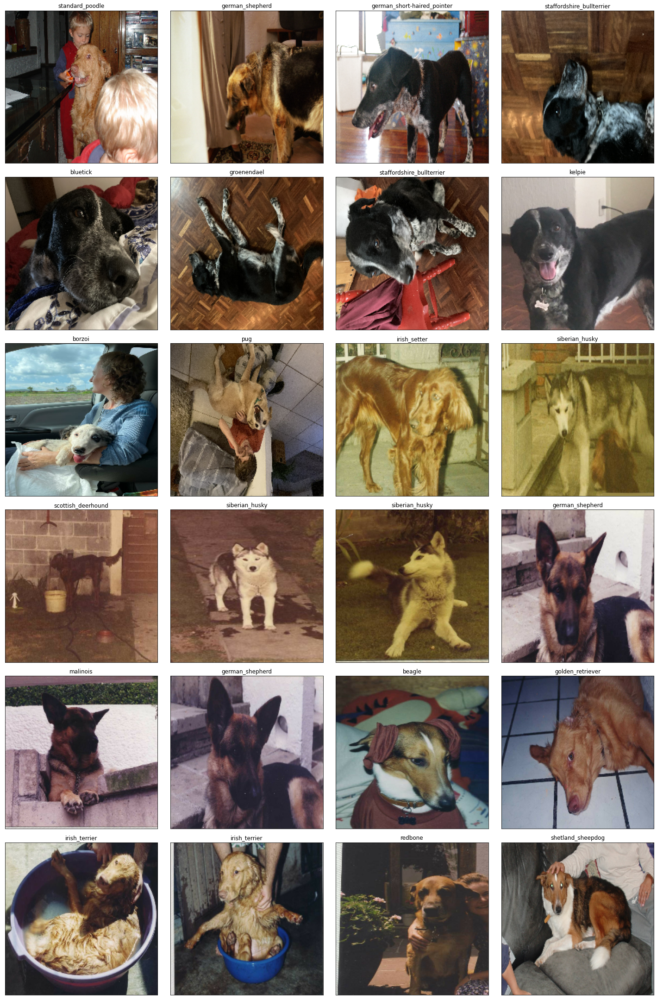

In [ ]:
#show custom images with predicted labels

num_rows = 10
num_cols =2
num_img = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i, image in enumerate(custom_images):
  plt.subplot(num_rows,2*num_cols,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(image)
  plt.title(custom_pred_labels[i])
plt.tight_layout(h_pad=1.0)
plt.show()

